# Multi-class Dog Breed Classification

This notebook uses TensorFlow 2.0 and Tensorflow Hub to build a multiclass image classifier


## 1. Problem
Identifying the breed, given an image of a dog.


## 2. Data
Data used is taken from Kaggle.
https://www.kaggle.com/c/dog-breed-identification/data


## 3. Evaluation
The resultant model will evaluated based on the `Multi-class Log Loss`.

The submission file will be in the format of a csv with prediction probabilities of every dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation



## 4. Features
Some info about the data:
- Dealing with images (unstructured)
- There are 120 breeds of dog.
- 10222 unique training images.
- 10358 unique test images.

## Start by getting workspace ready...
-> import all libraries neccesary
- TensorFlow
- TensorFlow Hub

-> Make Sure we Use a GPU

In [ ]:
#Import libraries
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

#Check whether theres GPU available
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available


## Get Data Ready
Extracting data from 
x/content/drive/MyDrive/Machine Learning Online Course
then turning the images to Tensors (numerical)

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/Machine Learning Online Course/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


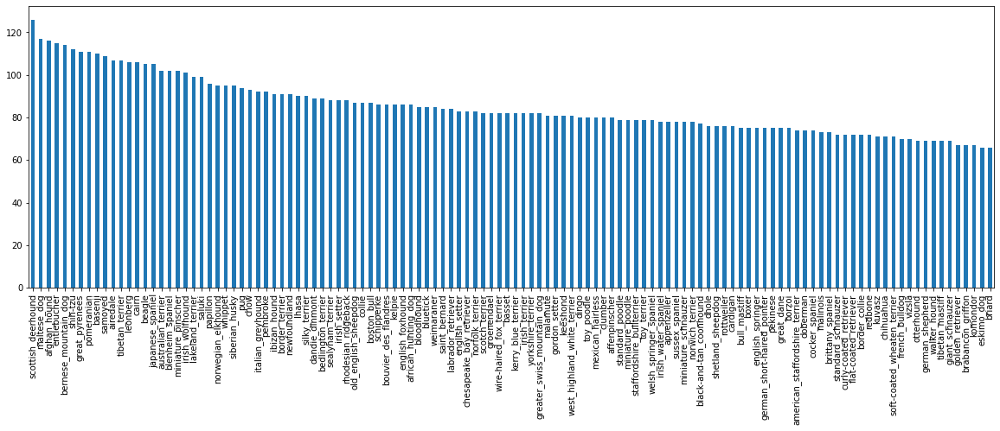

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=[20,6])

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

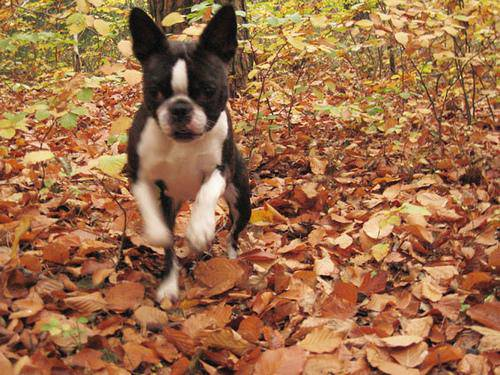

In [ ]:
Image("/content/drive/MyDrive/Machine Learning Online Course/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
def imgshow(id):
  return Image(data=f"drive/MyDrive/Machine Learning Online Course/train/{id}.jpg")

In [ ]:
# create path names
filenames = ["drive/MyDrive/Machine Learning Online Course/train/" + fname + ".jpg" for fname in labels_csv["id"]]

In [ ]:
#check first 10 path names
filenames[:10]

['drive/MyDrive/Machine Learning Online Course/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Machine Learning Online Course/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Check whether num of filenames match image files
import os

if len(os.listdir("drive/MyDrive/Machine Learning Online Course/train/")) == len(filenames):
  print("Match!")
else:
  print("Not Match!")


NameError: ignored

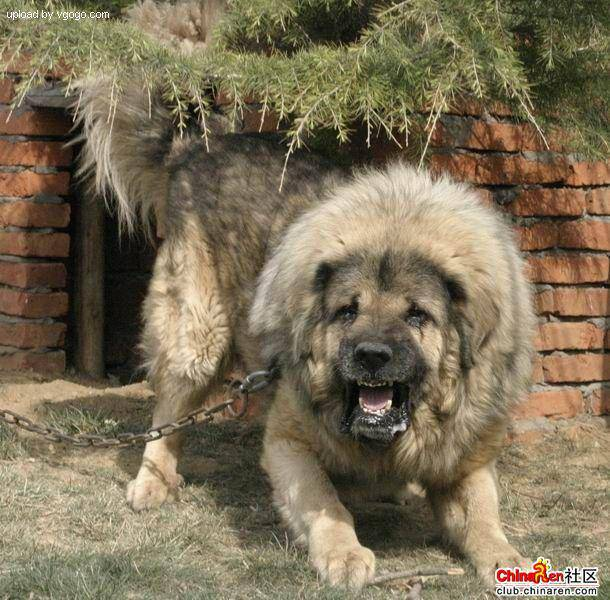

In [ ]:
Image(filenames[9000])

Since we've got our training image filepaths, 
## lets prepare the labels...

In [ ]:
labels = np.array(labels_csv["breed"])
# or labels.csv["breed"].to_numpy() ---> does the same thing as above 
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
len(labels) == len(filenames)
#Number of labels and filenames match, hence can proceed safely...

NameError: ignored

In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)
#Number of unique breeds

120

In [ ]:
#Convert labels into a boolean array 
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels[0]) # label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occur in boolean array
print(boolean_labels[0].astype(int)) #convert bool to int

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Since the datas are accessible by machine now (numeric format now)...

## Let us continue by splitting data...
We are going to create our own validation set

In [ ]:
#Setup x and y data
x = filenames
y = boolean_labels

In [ ]:
x[:5], y[:5]

(['drive/MyDrive/Machine Learning Online Course/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'drive/MyDrive/Machine Learning Online Course/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  'drive/MyDrive/Machine Learning Online Course/train/001cdf01b096e06d78e9e5112d419397.jpg',
  'drive/MyDrive/Machine Learning Online Course/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  'drive/MyDrive/Machine Learning Online Course/train/0021f9ceb3235effd7fcde7f7538ed62.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, 

Data is very much (10222 images), so to be more time efficient, we will be starting off with only 1000 images, then continue to increase as needed.

In [ ]:
# Number of images used for experimentation
NUM_IMAGES = 1000 #@param {type:"slider", min : 1000, max : 10000, step : 1000}

In [ ]:
from sklearn.model_selection import train_test_split

#Split to train and validation
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:2], y_train[:2]

(['drive/MyDrive/Machine Learning Online Course/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Machine Learning Online Course/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False

## Preprocessing Images (Image to Tensors)

In [ ]:
image = plt.imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now that we've seen example of an image as a tensor, 
## We will make a function
1. Take `image` filepath as input
2. User Tensorflow to read file and save as new variable
3. Turn `image` to `Tensors`
4. Normalize `image` from (0-255) to (0-1)
5. Resize `image` (jpg) to same shape (224,224)
6. Return `modified image`

In [ ]:
#Define image size
IMG_SIZE = 224

#Function for preprocessing
def process_image(filename, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns it into a tensor.
  """
  #read image
  image = tf.io.read_file(filename)

  #turn jpeg to numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert colour channels values 0-255 to 0-1 values.
  #This is a normalization process to make process more efficient.
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize to (224,224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches
According to professional
- batch size optimal => 32

Why turn our data into batches?
- Let's say we're processing 10000 images in one go, they might not fit into the memory...
- So that's why we do about 32 images (batch size) at a time...
- Note batch size can be changed manually if needed

In order to use Tensorflow effectively, we need our data in the form of `Tensor tuples` which would look like this :
`(image, label)`

In [ ]:
#Create a function to return a tuple of (image, label)
def get_image_tuple(filename, label):
  """
  Takes an image file path and label
  then processes and return a tuple (image, label)
  """
  image = process_image(filename)
  return image, label

In [ ]:
#Demo of function above
get_image_tuple(x[42], y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now lets make a function to turn data into batches

In [ ]:
#Define batch size, 32 is a good start
BATCH_SIZE = 32 #@param {type:"slider", min : 32, max : 1000, step : 1000}

In [ ]:
#function to turn data to batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of (image x) and (label y) pairs.
  Shuffles the data if its training data, but not when validation data.
  Also accepts test data as input (no labels).
  """
  #If test dataset, we probably don't have labels
  if test_data:
    print(f"Creating test data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(process_image).batch(batch_size)

  #If validation dataset, we don't need to shuffle
  elif valid_data:
    print(f"Creating validation data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_tuple).batch(batch_size)
  
  else:
    print(f"Creating training data batches... BATCH SIZE={batch_size}")
    #turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    #shuffle
    data = data.shuffle(buffer_size=len(x))

    #process into (image,label) tuple and make batch
    data = data.map(get_image_tuple)
    data_batch = data.batch(batch_size)
  return data_batch


In [ ]:
#Create Train and Validation batches

train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches... BATCH SIZE=32
Creating validation data batches... BATCH SIZE=32


In [ ]:
# Check out different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## VISUALIZING DATA BATCHES
Our data is now in batches, however its still a bit hard to understand...

So lets visualize them

In [ ]:
#Create function for viewing images in data batches

def show_32_images(images, labels):
  """
  Display a plot of 25 images and their labels from data batch
  """
  plt.figure(figsize=(10,16))
  for i in range(32):
    #create subplots 4x8
    ax = plt.subplot(8,4, i+1)
    #Display Image
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    #remove axis
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator()) #This function unbatches it into a numpy array
len(train_images), len(train_labels) #shows shape 32,32 since its batch size is 32...

(32, 32)

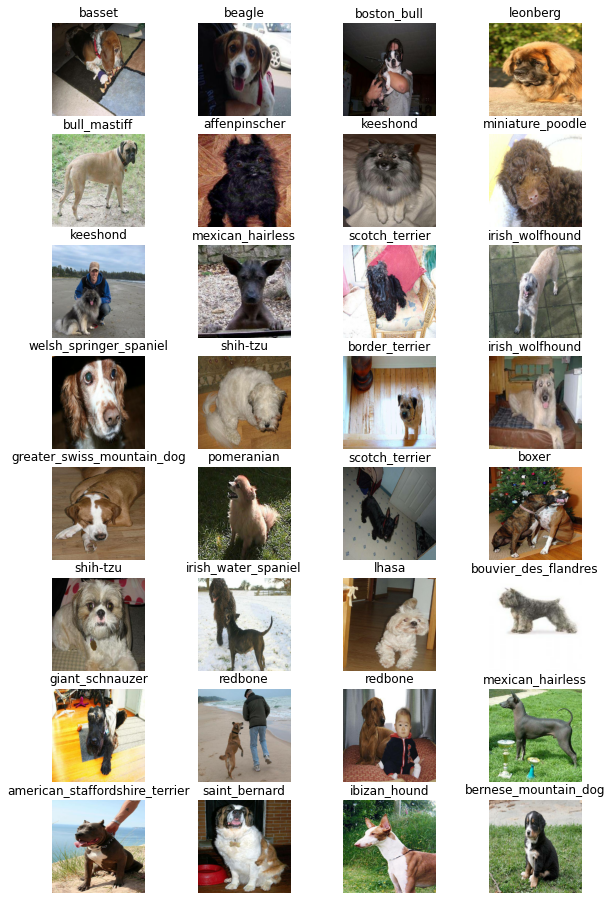

In [ ]:
show_32_images(train_images, train_labels)

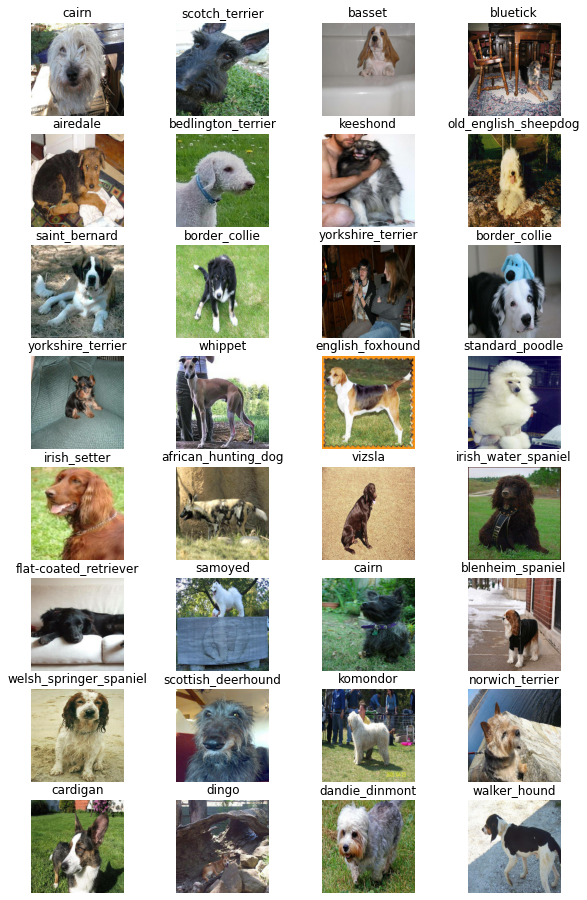

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_32_images(val_images, val_labels)

## Building a Model !

Before we build a model, there are a few things we need to define:
* The input shape (image shape in the form of Tensors)
* The output shape (image labels in the form of Tensors)
* URL of model we want to use Transfer Learning with from TensorFlow Hub
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

^^ MobileNet Image Classification (Size = 224x224, Depth Multiplier = 1.3)

In [ ]:
#setup input shape into the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channel

#setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#setup model URL from Tensorflow HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our Inputs, Outputs, and Model ready...
Lets put them together into a Keras Deep Learning Model!

Knowing this, let's create a function that:
* takes input shape, output shape, and model as parameters
* Defines the layers of KEras Model in a sequential fashion
* Compiles the model (Says it should be evaluated and improved)
* Builds model (Tell model the input shape it'll be getting)
* Return the model

All the steps can be found in https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a Function which builds a Keras Model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building model with {MODEL_URL}")

  # Setup Model Layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (Input Layer)
    tf.keras.layers.Dense(units=output_shape, 
                          activation="softmax") # Layer 2 (Output Layer)       
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics =["accuracy"]
  )

  # Build Model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to:
* Save its progress
* Check its progress
* Stop Training early if it stops improving

We'll create 2 callbacks,
- One is for TensorBoard, helps track our model progress
- Second is for early stopping, prevents model from training too long (becoming overfitted)



### TensorBoard Callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

To setup the Tensorboard Callback, we need to:
1. Load a TensorBoard notebook Extension
2. Create a Tensorboard Callback which save logs to a directory and pass it to the model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
# Load TensorBoard Notebook Extension
%load_ext tensorboard

In [ ]:
import datetime

# Create TensorBoard Callback Function
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Machine Learning Online Course/Logs",
                        datetime.datetime.now().strftime("%Y/%m/%d-%H:%M:%S") # Tracks time everytime we run experiment
                        )
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

Helps model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training the Model (on subset of data)

Our first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU (IMPORTANT COZ ITS SO MUCH FASTER)
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, num of epochs to train for (`NUM_EPOCHS`), and callbacks
* Return Model

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create model
  model = create_model()

  # Create new TensorBoard session everytime we train the model
  tensorboard = create_tensorboard_callback()

  # Fit the model
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping]
            )
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 129s 2s/step - loss: 4.5831 - accuracy: 0.0900 - val_loss: 3.3693 - val_accuracy: 0.3150
Epoch 2/100
25/25 [==============================] - 3s 128ms/step - loss: 1.6319 - accuracy: 0.6625 - val_loss: 2.1713 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 3s 126ms/step - loss: 0.5688 - accuracy: 0.9388 - val_loss: 1.7064 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 4s 152ms/step - loss: 0.2523 - accuracy: 0.9850 - val_loss: 1.5196 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 151ms/step - loss: 0.1467 - accuracy: 0.9962 - val_loss: 1.4547 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 127ms/step - loss: 0.1000 - accuracy: 1.0000 - val_loss: 1.3933 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] 

### Checking the TensorBoard Logs

the Tensor board function `%tensorboard` will access the logs we created and visualize its content

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Machine\ Learning\ Online\ Course/Logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating Predictions using TRAINED Model

In [ ]:
# Make Predictions on validation data (not trained on)

preds = model.predict(val_data, verbose=1)
preds

7/7 [==============================] - 1s 109ms/step


array([[8.2078628e-04, 9.8859760e-05, 1.1512813e-03, ..., 3.0919837e-04,
        3.1137017e-05, 4.6462035e-03],
       [7.9212524e-03, 1.3413848e-03, 8.6655030e-03, ..., 3.1118689e-04,
        1.7787308e-03, 1.4807102e-04],
       [1.9490617e-05, 1.9790186e-05, 1.5770576e-05, ..., 2.4444145e-05,
        1.5619922e-05, 5.1104318e-04],
       ...,
       [1.3535902e-05, 1.2629424e-04, 2.5394699e-04, ..., 4.7854996e-05,
        6.2411462e-05, 1.2363211e-04],
       [1.1965980e-02, 1.1586349e-04, 1.2984687e-04, ..., 5.6878496e-05,
        1.5419858e-04, 6.1905640e-03],
       [2.4916180e-03, 2.7710372e-05, 1.0335688e-03, ..., 3.2798650e-03,
        2.4511919e-03, 8.8272580e-05]], dtype=float32)

In [ ]:
preds.shape 

(200, 120)

In [ ]:
np.sum(preds[0]) # SoftMax Function makes result value from 0-1 and total of it is around 1.0 (like probability)

1.0

In [ ]:
# Lets make a function that convert the array of numbers into a label prediction...
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
# Get predicted label based on array of prediction probabilities
pred_label = get_pred_label(preds[81])
pred_label

Since the val_data is still in a batch dataset, we have to unbatch it so that we can compare prediction labels with it

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Function to unbatch datasets
def unbatchify(data=val_data):
  """
  Takes batched dataset of (image, labels) Tensors and 
  returns separate arrays of images and labels.
  """

  images_ = []
  labels_ = []
  # Loop through unbatched data and unbatch em
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(get_pred_label(label))

  return images_, labels_

In [ ]:
unbatched_image, unbatched_label = unbatchify()
unbatched_image[0], unbatched_label[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Personal function to check accuracy of prediction
def preds_check(index=0,preds=preds, verbose=False):
  if verbose:
    print(preds[index])
  print(f"Max value (probability of prediction) : {np.max(preds[index])}")
  print(f"Sum : {np.sum(preds[index])}")
  print(f"Max Index: {np.argmax(preds[index])}")
  print(f"Predicted label: {get_pred_label(preds[index])}")
  print(f"Actual label: {unbatched_label[index]}")

In [ ]:
preds_check(0)

Max value (probability of prediction) : 0.4733145236968994
Sum : 1.0
Max Index: 17
Predicted label: border_terrier
Actual label: cairn


Now we've got to get:
- Prediction Label
- Truth Labels
- Truth Images

Lets make some function to visualize this.

The function:
* Take an array of prediction, array of truth labels and array of images and an integer (index)
* COnvert prediction probabilities to label
* Plot predicted label, and predicted probability, truth label, and target image in a plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change color if right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change plot title to predicted, prob predicted, truth label
  plt.title("{} / {:2.2f}% / {}".format(pred_label, 
                                        np.max(pred_prob)*100,
                                        true_label),
            color=color)


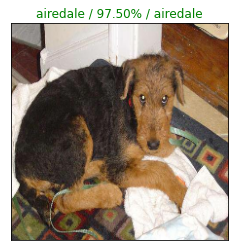

In [ ]:
plot_pred(preds,unbatched_label,unbatched_image, 4)

In [ ]:
#Create function for viewing Prediction results as above in data batches

def plot_pred_batch(preds, labels, images):
  """
  Display a plot of 32 images and their labels from data batch
  """
  plt.figure(figsize=(20,16))
  for i in range(32):
    #create subplots 4x8
    ax = plt.subplot(8,4, i+1)
    #Display Image
    plot_pred(preds, labels, images, i)
    #remove axis
    plt.axis("off")

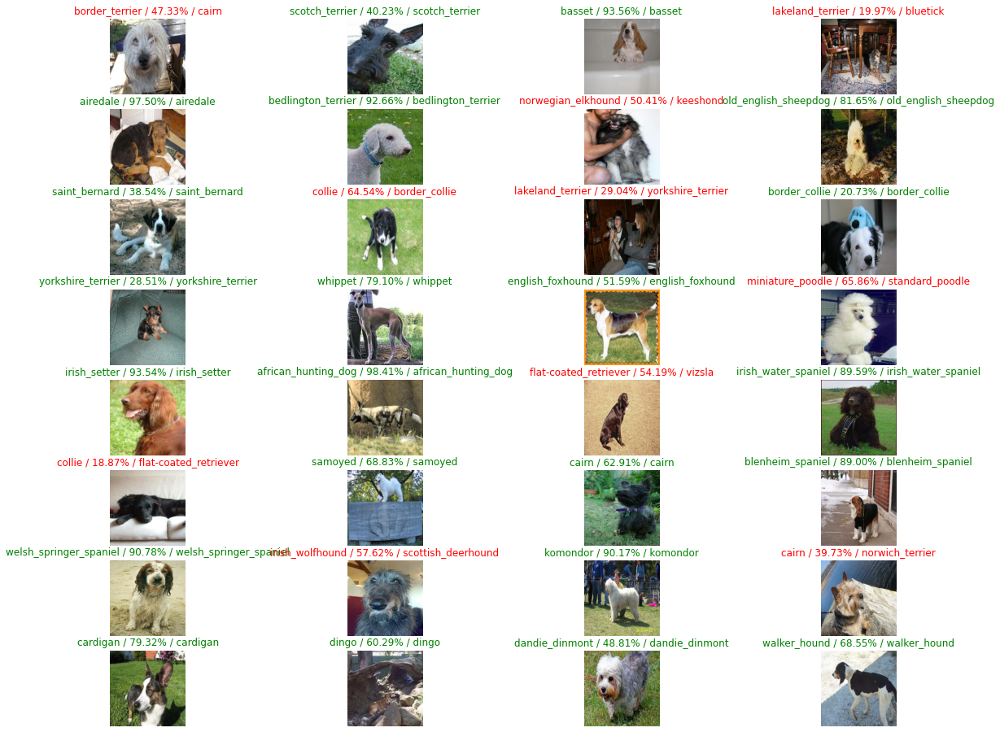

In [ ]:
plot_pred_batch(preds,unbatched_label,unbatched_image)

Now that we've got a function to visualize top prediction of our model, lets make one that views our top 10 predictions

THe function will:
* Take an input of prediction probability array, truth array, integer
* FInd prediction using `get_pred_label()`
* Find Top 10:
  * Prediction probability index
  * PRediction probabilitiy value
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring true green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], get_pred_label(labels[n])

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indexes
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]
  # Find top 10 prediction confidence values
  top_10_pred_value = pred_prob[top_10_pred_index]
  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_index]

  # Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_value,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color
  if np.isin(true_label, top_10_pred_labels).any():
    print("Truth Label = ", true_label)
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")


Truth Label =  border_collie


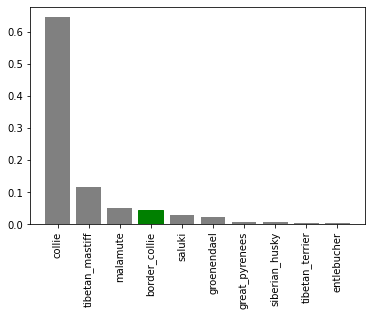

In [ ]:
plot_pred_conf(preds, val_labels, 9)

In [ ]:
get_pred_label(val_labels[9])

'border_collie'

Now weve got some functions to help us visualize our predictions and evaluate our models, lets check a few (MORE THAN ONE)

Truth Label =  yorkshire_terrier
Truth Label =  border_collie
Truth Label =  yorkshire_terrier
Truth Label =  whippet
Truth Label =  english_foxhound
Truth Label =  standard_poodle


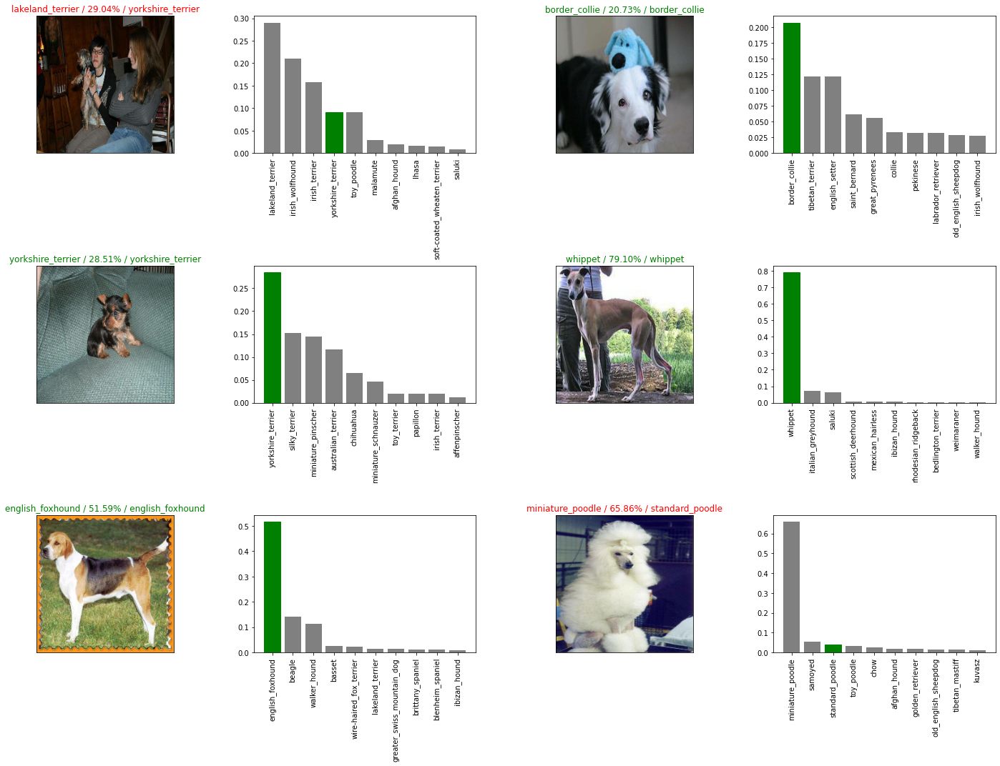

In [ ]:
# Check a few predictions and compare their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=preds, 
            labels=unbatched_label, 
            images=unbatched_image, 
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(preds, val_labels, i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
pred_list = []
for i in preds:
  pred_list.append(get_pred_label(i))

**Challenge**: How would you create a confusion matrix with our predictions and true labels

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf = confusion_matrix(unbatched_label, pred_list)
disp_conf = ConfusionMatrixDisplay(conf)

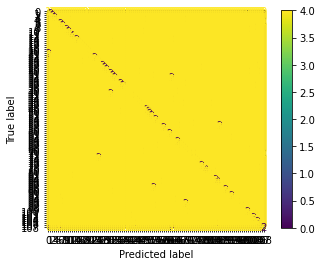

In [ ]:
disp_conf.plot()
plt.show()

In [ ]:
from sklearn.metrics import multilabel_confusion_matrix, ConfusionMatrixDisplay

mcm = multilabel_confusion_matrix(unbatched_label, pred_list, labels = unique_breeds)


## Saving and reloading a trained model

In [ ]:
# Create a function to save model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  """

  # Create model directory pathname. with current time
  modeldir = os.path.join("/content/drive/MyDrive/Machine Learning Online Course/Models",
                          datetime.datetime.now().strftime("%Y:%m:%d-%H:%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer" : hub.KerasLayer})
  return model

Now we've got a function to save and load a model, lets try and make sure it works

In [ ]:
# Save a model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-15:331655307202-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-15:331655307202-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a model trained on 1000 images
loaded_1000_image_model = load_model("/content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-10:221655288537-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-10:221655288537-1000-images-mobilenetv2-Adam.h5


In [ ]:
loaded_1000_image_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
# Evaluate model
print("BEFORE SAVED")
model.evaluate(val_data)
print("AFTER LOADED")
loaded_1000_image_model.evaluate(val_data)

BEFORE SAVED
7/7 [==============================] - 1s 79ms/step - loss: 1.3300 - accuracy: 0.6550
AFTER LOADED
7/7 [==============================] - 1s 83ms/step - loss: 1.2254 - accuracy: 0.7050


[1.2253504991531372, 0.7049999833106995]

## Training a big dog model (full data instead of just 1000)

In [ ]:
len(x), len(y), len(x_train), len(y_train)

(10222, 10222, 800, 800)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches... BATCH SIZE=32


In [ ]:
# Create full model
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set since we're training on all the data, so we can't monitor validation accuracy (So we need to use early stopping)
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3) # Stops when accuracy does not improve for 3 epochs

**Note:** Running the cell below will take a while (Around 30 mins++ for first epoch) because we have to load all the images into the memory. (This is why we try with 1000 images first). 

=> Make sure to run a save_model directly after the fitting (Too be safe, since being AFK for a long time while waiting for it to finish can sometimes dismount the runtime/error can occur)

In [ ]:
# Fit the model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping]
               )

Epoch 1/100
320/320 [==============================] - 38s 110ms/step - loss: 1.3327 - accuracy: 0.6709
Epoch 2/100
320/320 [==============================] - 44s 138ms/step - loss: 0.3997 - accuracy: 0.8823
Epoch 3/100
320/320 [==============================] - 35s 110ms/step - loss: 0.2378 - accuracy: 0.9368
Epoch 4/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1526 - accuracy: 0.9649
Epoch 5/100
320/320 [==============================] - 37s 116ms/step - loss: 0.1069 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0762 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0597 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0464 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0384 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 38s 117m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5


## Making Predictions on the test dataset

Since our model has been trained in the form of Tensor batches, we have to do the same for our test data.

Luckily we have a function `create_data_batches()` for it.

To make predictions:
* Get the test image filenames
* Convert file name to test data batches using `create_data_batches()` and setting the `test_data` parameter into `True`.
* Make a prediction array by passing the test batches to the `predict()` method

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Machine Learning Online Course/test/"

# Makes a list of all the images' paths in the test folder
test_filenames = [test_path + fname for fname in os.listdir(test_path)] 
test_filenames[:10]

['/content/drive/MyDrive/Machine Learning Online Course/test/de9fc145601771b7a5b7e68822416fb5.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/df58b248e14af15c43fb4a3ebc00e9a3.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/dccf2e91f79396055e7ff83f1f207fbc.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/e4cffb02169d9b46810d50c6b9eae28d.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/e5ba665e01b6927411d60158f28160dd.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/df645ae75554d4d7130bfa1b72be53ce.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/df577444ba8b7733f42c49e9d42111a9.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/de85fdcf74dbe025b9b89819735cb9bc.jpg',
 '/content/drive/MyDrive/Machine Learning Online Course/test/df92d68c07ec91b2f67cec77980e00cf.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches... BATCH SIZE=32


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` and passing the test data batch might take quite a while to run (about ~1 hour) because of the test data size (10k++)

=> Similar to fitting, it is recommended you save the predictions directly after it finishes to avoid any errors (waste of a long time)

In [ ]:
# Make predictions on test data
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1194s 4s/step


In [ ]:
# Save predictions (NumPy Array) to csv file (for future access)
np.savetxt("/content/drive/MyDrive/Machine Learning Online Course/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions from csv file
loaded_test_predictions = np.loadtxt("/content/drive/MyDrive/Machine Learning Online Course/preds_array.csv", delimiter=",")

In [ ]:
loaded_test_predictions[:10]

array([[1.52565755e-11, 7.42076534e-09, 3.35456326e-13, ...,
        6.03096026e-08, 4.33748006e-08, 5.66379610e-10],
       [8.84319305e-01, 1.73245895e-09, 4.84222511e-08, ...,
        3.00288322e-10, 2.23527366e-07, 1.02138713e-01],
       [9.02686907e-07, 2.25947794e-09, 3.88254290e-10, ...,
        8.92114915e-09, 1.74586621e-05, 6.81496613e-06],
       ...,
       [3.90967870e-07, 3.12785284e-11, 5.62127740e-11, ...,
        8.85562543e-12, 1.54508420e-10, 1.53937182e-10],
       [1.62208984e-08, 1.39197436e-08, 4.54269424e-02, ...,
        4.29041174e-05, 1.29038156e-07, 4.71930907e-05],
       [7.74302844e-10, 1.73283832e-10, 8.40919836e-13, ...,
        5.13105319e-14, 4.48470674e-14, 5.29160604e-11]])

In [ ]:
loaded_test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Based on Kaggle sample submission 
kaggle.com/c/dog-breed-identification/overview/evaluation,

We need an ID column and probability column for each dog breed
* Create pandas DataFrame with ID Column as well as column for each 
dog breed
* Add data to the ID column by extracting test image ID from filepaths
* Add data to each dog breed columns.
* Export DataFrame to CSV and submit to Kaggle

In [ ]:
# Create empty pandas DataFrame
final_result = pd.DataFrame(columns=["id"] + list(unique_breeds))
final_result.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_id = [os.path.splitext(fname)[0] for fname in os.listdir(test_path)]
test_id

['de9fc145601771b7a5b7e68822416fb5',
 'df58b248e14af15c43fb4a3ebc00e9a3',
 'dccf2e91f79396055e7ff83f1f207fbc',
 'e4cffb02169d9b46810d50c6b9eae28d',
 'e5ba665e01b6927411d60158f28160dd',
 'e78b4a09e5f86c330e24c6aaed63f0be',
 'df645ae75554d4d7130bfa1b72be53ce',
 'df577444ba8b7733f42c49e9d42111a9',
 'de85fdcf74dbe025b9b89819735cb9bc',
 'df92d68c07ec91b2f67cec77980e00cf',
 'e3d417026b89cbb57b00a7208421009d',
 'ec0a814cc971dbe6e618a9a37ba355f8',
 'ec2a07ae6eaa64dac4154584ef229937',
 'f2d8c849a9ec1a3217e53ebbb7d50e3e',
 'f07d1123c4259713a46991de0b02ffd0',
 'eb2e408930e0873deb85484ef46f07fd',
 'f01df7641b237cd177d71fdb8db9bd58',
 'eb8473f9fc102c45e0c0abd07de20a2a',
 'ef413ae9b0de80605bc95de2d12a4082',
 'ed3ff512284e226da7ce2853a0faeed7',
 'f33c435b1e92d5a639e6fc9463821595',
 'ed574861296d0946948a4225e60e8d75',
 'e9dd82ed2a7066d81d32a182ee18916c',
 'ed67681e7935d75f9ce011dbf8474fe4',
 'ed0690862339bb098b08da7ed8b4eac2',
 'ec8bf9fd1bae9c6cc54b996425538a5c',
 'ec0ed65df0e457182b62ee172783c574',
 

In [ ]:
final_result["id"] = test_id

In [ ]:
final_result.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de9fc145601771b7a5b7e68822416fb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df58b248e14af15c43fb4a3ebc00e9a3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dccf2e91f79396055e7ff83f1f207fbc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4cffb02169d9b46810d50c6b9eae28d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e5ba665e01b6927411d60158f28160dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add prediction probabilities to each column
# for cols in range(len(unique_breeds)):
#     final_result[unique_breeds[cols]] = [i[cols] for i in loaded_test_predictions]
final_result[list(unique_breeds)] = loaded_test_predictions

In [ ]:
final_result.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de9fc145601771b7a5b7e68822416fb5,1.525658e-11,7.420765e-09,3.354563e-13,1.190099e-09,3.795068e-09,1.809822e-07,2.919586e-09,1.004195e-06,2.120241e-06,...,5.480717e-11,1.898954e-11,1.391992e-05,1.930907e-05,6.543828e-07,4.145117e-08,2.842097e-13,6.030960e-08,4.337480e-08,5.663796e-10
1,df58b248e14af15c43fb4a3ebc00e9a3,8.843193e-01,1.732459e-09,4.842225e-08,6.935565e-10,2.189534e-11,7.281967e-10,7.946514e-07,4.587155e-10,3.532930e-12,...,2.517648e-07,8.120539e-06,5.181607e-09,1.013076e-09,1.060602e-08,3.076529e-10,8.467079e-08,3.002883e-10,2.235274e-07,1.021387e-01
2,dccf2e91f79396055e7ff83f1f207fbc,9.026869e-07,2.259478e-09,3.882543e-10,8.677405e-09,3.820191e-07,1.928244e-10,4.841660e-11,5.773095e-06,4.455886e-04,...,2.041843e-02,4.433007e-09,2.218942e-06,1.406460e-08,5.077595e-07,1.685187e-06,2.905859e-06,8.921149e-09,1.745866e-05,6.814966e-06
3,e4cffb02169d9b46810d50c6b9eae28d,6.464155e-11,1.848174e-09,1.302361e-12,1.428803e-10,4.260595e-13,9.264655e-14,2.185718e-12,3.081800e-14,1.788882e-11,...,1.828727e-09,3.082562e-12,4.160522e-11,4.690633e-10,9.842598e-13,2.009224e-11,2.836739e-13,6.063233e-10,3.232551e-11,5.522764e-10
4,e5ba665e01b6927411d60158f28160dd,1.417586e-09,1.324444e-09,9.973094e-01,7.003839e-10,2.389391e-09,4.835938e-12,8.918802e-06,1.227837e-08,1.592525e-09,...,3.364017e-07,3.318768e-07,1.079062e-09,3.033825e-11,1.541518e-09,3.566319e-09,2.382810e-09,1.705599e-09,3.145112e-09,5.158587e-10


In [ ]:
# Saving our predictions into a csv for submissions to Kaggle
final_result.to_csv("/content/drive/MyDrive/Machine Learning Online Course/full_model_predictions_submission_1_mobilenetV2.csv",
                    index=False)

## Making predictions on custom images

To make predictions we need to:
* Get file path of image
* Turn filepath into data batches using `create_data_batches()` with test_data params as True
* Pass cuystom image to model's `predict()` method
* Convert prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
#Import libraries
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import Image
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

#Check whether theres GPU available
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

labels_csv = pd.read_csv("/content/drive/MyDrive/Machine Learning Online Course/labels.csv")
print(labels_csv.describe())
labels_csv.head()
labels = np.array(labels_csv["breed"])
# or labels.csv["breed"].to_numpy() ---> does the same thing as above 
labels

unique_breeds = np.unique(labels)
len(unique_breeds)
#Number of unique breeds

#Define image size
IMG_SIZE = 224

#Function for preprocessing
def process_image(filename, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns it into a tensor.
  """
  #read image
  image = tf.io.read_file(filename)

  #turn jpeg to numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert colour channels values 0-255 to 0-1 values.
  #This is a normalization process to make process more efficient.
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize to (224,224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

#Create a function to return a tuple of (image, label)
def get_image_tuple(filename, label):
  """
  Takes an image file path and label
  then processes and return a tuple (image, label)
  """
  image = process_image(filename)
  return image, label

#function to turn data to batches
BATCH_SIZE = 32
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of (image x) and (label y) pairs.
  Shuffles the data if its training data, but not when validation data.
  Also accepts test data as input (no labels).
  """
  #If test dataset, we probably don't have labels
  if test_data:
    print(f"Creating test data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(process_image).batch(batch_size)

  #If validation dataset, we don't need to shuffle
  elif valid_data:
    print(f"Creating validation data batches... BATCH SIZE={batch_size}")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_tuple).batch(batch_size)
  
  else:
    print(f"Creating training data batches... BATCH SIZE={batch_size}")
    #turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) # labels
    #shuffle
    data = data.shuffle(buffer_size=len(x))

    #process into (image,label) tuple and make batch
    data = data.map(get_image_tuple)
    data_batch = data.batch(batch_size)
  return data_batch

# Lets make a function that convert the array of numbers into a label prediction...
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Create a function to load model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer" : hub.KerasLayer})
  return model

# Personal function to check accuracy of prediction
def preds_check(preds, index=0, verbose=False):
  if verbose:
    print(preds[index])
  print(f"Max value (probability of prediction) : {np.max(preds[index])}")
  print(f"Sum : {np.sum(preds[index])}")
  print(f"Max Index: {np.argmax(preds[index])}")
  print(f"Predicted label: {get_pred_label(preds[index])}")

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5


In [ ]:
# Get custom image filepath
custom_path = "/content/drive/MyDrive/Machine Learning Online Course/custom-images/"
filename = [custom_path + fname for fname in os.listdir(custom_path)]
filename

['/content/drive/MyDrive/Machine Learning Online Course/custom-images/pompom.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/WhatsApp Image 2022-06-16 at 8.28.28 PM.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/image.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/WhatsApp Image 2022-06-16 at 9.22.39 PM.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/Shiba-Inu-standing-in-profile-outdoors.jpeg']

In [ ]:
# Turn images into batch datasets
file_batch = create_data_batches(filename, test_data=True)
file_batch

Creating test data batches... BATCH SIZE=32


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the data
prediction = loaded_full_model.predict(file_batch)
prediction.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(i) for i in prediction]
custom_pred_labels

['pomeranian', 'shih-tzu', 'cairn']

In [ ]:
# Unbatch batched datasets
custom_images = []
for image in file_batch.unbatch().as_numpy_iterator():
  custom_images.append(image)

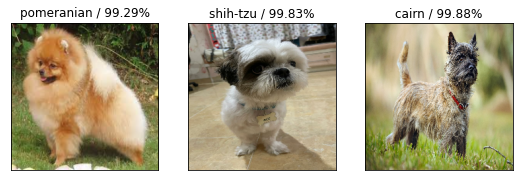

In [ ]:
# Check custom image predictions
plt.figure(figsize=(9,9))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title("{} / {:2.2f}%".format(custom_pred_labels[i], np.max(prediction[i])*100))
  plt.imshow(image)

In [ ]:
# COMPLETE DOG BREED PREDICTION FUNCTION
def dog_breed_predict(filename_list: list, model):
  # Turn images into batch datasets
  file_batch = create_data_batches(filename, test_data=True)
  # Make predictions on the data
  prediction = loaded_full_model.predict(file_batch)
  # Get custom image prediction labels
  custom_pred_labels = [get_pred_label(i) for i in prediction]
  # Unbatch batched datasets
  custom_images = []
  for image in file_batch.unbatch().as_numpy_iterator():
    custom_images.append(image)
  # Plot results
  no_rows = len(filename_list)//3 + (0 if (len(filename_list)%3 == 0) else 1)
  no_cols = 3
  if len(filename_list) < 3:
    no_cols = len(filename_list) * 3

  plt.figure(figsize=(3*no_cols,3*no_rows))
  for i, image in enumerate(custom_images):
    plt.subplot(no_rows,3,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title("{} / {:2.2f}%".format(custom_pred_labels[i], np.max(prediction[i])*100))
    plt.imshow(image)

In [ ]:
# Load model
loaded_full_model = load_model("/content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning Online Course/Models/2022:06:15-16:001655308824-full-image-set-mobilenetv2-Adam.h5


Creating test data batches... BATCH SIZE=32


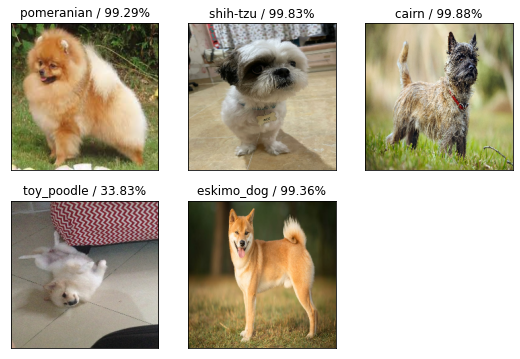

In [ ]:
dog_breed_predict(filename, loaded_full_model)

In [ ]:
# Get custom image filepath
custom_path = "/content/drive/MyDrive/Machine Learning Online Course/custom-images/"
filename = [custom_path + fname for fname in os.listdir(custom_path)]
filename

['/content/drive/MyDrive/Machine Learning Online Course/custom-images/pompom.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/WhatsApp Image 2022-06-16 at 8.28.28 PM.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/Shiba-Inu-standing-in-profile-outdoors.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/WhatsApp Image 2022-06-16 at 9.22.39 PM.jpeg',
 '/content/drive/MyDrive/Machine Learning Online Course/custom-images/image.jpeg']

## Data Augmentation for further improvements on model

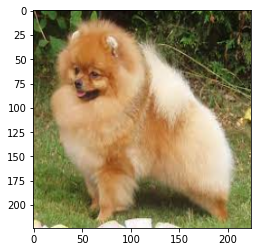

In [ ]:
image = process_image(filename[0])
plt.imshow(image)

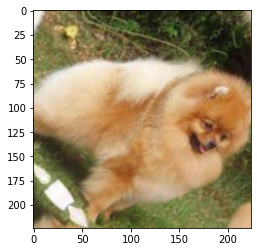

In [ ]:
augmented_image = data_augmentation(image)
plt.imshow(augmented_image)

In [2]:
#Import libraries
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

labels_csv = pd.read_csv("/content/drive/MyDrive/Machine Learning Online Course/labels.csv")
labels = np.array(labels_csv["breed"])
# or labels.csv["breed"].to_numpy() ---> does the same thing as above 
# create path names
filenames = ["drive/MyDrive/Machine Learning Online Course/train/" + fname + ".jpg" for fname in labels_csv["id"]]
unique_breeds = np.unique(labels)
boolean_labels = [label == unique_breeds for label in labels]
#Setup x and y data
x = filenames
y = boolean_labels

#Define image size
IMG_SIZE = 224

#Function for preprocessing
def process_image(filename, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns it into a tensor.
  """
  #read image
  image = tf.io.read_file(filename)

  #turn jpeg to numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert colour channels values 0-255 to 0-1 values.
  #This is a normalization process to make process more efficient.
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize to (224,224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available


In [3]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomZoom(0.2),
  tf.keras.layers.RandomCrop(height=IMG_SIZE, width=IMG_SIZE),
  tf.keras.layers.RandomContrast(0.25)
])

# # Add the image to a batch.
# image = tf.cast(tf.expand_dims(image, 0), tf.float32)

# plt.figure(figsize=(10, 8))
# for i in range(16):
#   augmented_image = data_augmentation(image)
#   ax = plt.subplot(4, 4, i + 1)
#   plt.imshow(augmented_image[0])
#   plt.axis("off")

In [ ]:
# CREATING DATA BATCH WITH AUGMENTED DATA
dat = np.load("/content/drive/MyDrive/Machine Learning Online Course/augmented_train/images3.npy", allow_pickle=True)
for pp in [4,5,6,7]:
  x_augmented = []
  y_augmented = []
  for fname in x[(pp-1)*1000:pp*1000]:
    image = process_image(fname)
    x_augmented.append(image)
    for i in range(4):
      image = data_augmentation(image)
      x_augmented.append(image)
  np.append(data, x_augmented, axis=0)
  print(f"{pp} done")
# for label in y: 
#   for i in range(5):
#     y.append(label)

In [ ]:
np.save("/content/drive/MyDrive/Machine Learning Online Course/augmented_train/images2.npy", np.array(x_augmented))
# df = pd.DataFrame(x_augmented, columns=["images"])
# df.to_csv("/content/drive/MyDrive/Machine Learning Online Course/augmented_train/images1.csv", index=False)

In [6]:
dat = np.load("/content/drive/MyDrive/Machine Learning Online Course/augmented_train/images1.npy", allow_pickle=True)
dat.shape

(1, 1, 1, 0)

In [ ]:
data = tf.data.Dataset.from_tensor_slices((x_augmented,y_augmented))
data = data.batch(32)

In [ ]:
len(x), len(y), len(x_augmented), len(y_augmented) # x8 amount

(800, 800, 4800, 4800)

In [ ]:
len(x)

10222

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create model
  model = create_model()

  # Create new TensorBoard session everytime we train the model
  tensorboard = create_tensorboard_callback()

  # Fit the model
  model.fit(x=data,
            epochs=NUM_EPOCHS,
            validation_data=val_data_batch,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping]
            )
  
  # Return the fitted model
  return model

In [ ]:
# Create full model
augment_model = create_model()
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set since we're training on all the data, so we can't monitor validation accuracy (So we need to use early stopping)
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3) # Stops when accuracy does not improve for 3 epochs

# Fit the model to full data
augment_model.fit(x=data,
               epochs=100,
               callbacks=[full_model_tensorboard, full_model_early_stopping]
               )

save_model(augment_model, suffix="full-augmented-image-set-mobilenetv2-Adam")

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
150/150 [==============================] - 16s 82ms/step - loss: 4.8989 - accuracy: 0.0973 - val_loss: 3.3979 - val_accuracy: 0.2650
Epoch 2/100
150/150 [==============================] - 15s 98ms/step - loss: 1.8401 - accuracy: 0.5440 - val_loss: 3.3574 - val_accuracy: 0.2450
Epoch 3/100
150/150 [==============================] - 13s 88ms/step - loss: 0.8376 - accuracy: 0.8152 - val_loss: 3.1808 - val_accuracy: 0.2900
Epoch 4/100
150/150 [==============================] - 14s 93ms/step - loss: 0.4222 - accuracy: 0.9358 - val_loss: 3.1500 - val_accuracy: 0.3300
Epoch 5/100
150/150 [==============================] - 15s 98ms/step - loss: 0.2390 - accuracy: 0.9785 - val_loss: 3.1648 - val_accuracy: 0.3200
Epoch 6/100
150/150 [==============================] - 15s 102ms/step - loss: 0.1508 - accuracy: 0.9923 - val_loss: 3.4022 - val_accuracy: 0.3150
Epoch 7/100
150/150 [================

In [ ]:
len(x)

10222